#### Attemping to do a yearly study of building permits in Seattle
#### See link for guide on the time slider thing

https://amaral.northwestern.edu/blog/step-step-how-plot-map-slider-represent-time-evolu

https://www.geeksforgeeks.org/how-to-make-a-choropleth-map-with-a-slider-using-plotly-in-python/


In [3]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import geopandas as gpd
import h3pandas

import plotly
import plotly.graph_objs as go
import plotly.offline as offline
from plotly.graph_objs import *
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

permits_df = pd.read_csv('C:/Users/aaron/Code/Data/Building_Permits_20240307.csv', parse_dates=[10])

pd.set_option('display.max_columns', None) ### This line makes all the columns display, rather than ellipses shorten

init_notebook_mode(connected=True)

In [4]:
### Add a 'year' column and drop everything without location data

permits_df['AppliedYear'] = pd.DatetimeIndex(permits_df['AppliedDate']).year
permits_df = permits_df.dropna(subset='Location1')

In [5]:
year = 2016.0
single_year_frame = permits_df[permits_df['AppliedYear'] == year]

In [9]:
single_year_frame.head()

,PermitNum,PermitClass,PermitClassMapped,PermitTypeMapped,PermitTypeDesc,Description,HousingUnits,HousingUnitsRemoved,HousingUnitsAdded,EstProjectCost,AppliedDate,IssuedDate,ExpiresDate,CompletedDate,StatusCurrent,RelatedMup,OriginalAddress1,OriginalCity,OriginalState,OriginalZip,ContractorCompanyName,Link,Latitude,Longitude,Location1,AppliedYear
51625,6481821-CN,Multifamily,Residential,Building,New,Establish use as apartment and construct a mul...,NaN,0.0,22.0,1306403.0,2016-12-30,2017-08-30,2020-08-28,2019-05-08,Completed,3021063-LU,2303 FRANKLIN AVE E,SEATTLE,WA,98102.0,NaN,https://cosaccela.seattle.gov/portal/customize...,47.639909,-122.325014,"(47.6399092, -122.32501365)",2016.0
51626,6504346-CN,Commercial,Non-Residential,Building,New,"Change of use from warehouse storage to hotel,...",NaN,NaN,NaN,16482998.0,2016-12-30,NaN,NaN,NaN,Corrections Required,3023025-LU,1915 3RD AVE,SEATTLE,WA,98101.0,NaN,https://cosaccela.seattle.gov/portal/customize...,47.611796,-122.340417,"(47.61179618, -122.34041744)",2016.0
51627,6494454-CN,Single Family/Duplex,Residential,Building,Addition/Alteration,Construct an addition and alterations to an ex...,NaN,0.0,1.0,61300.0,2016-12-30,2017-02-08,2018-08-08,2018-06-22,Completed,NaN,7136 32ND AVE S,SEATTLE,WA,98118.0,NaN,https://cosaccela.seattle.gov/portal/customize...,47.537716,-122.291126,"(47.53771631, -122.29112604)",2016.0
51628,6492105-PH,Commercial,Non-Residential,Building,New,Phased project: Construct west residential to...,0.0,0.0,571.0,192096624.0,2016-12-30,2019-04-30,2025-04-30,NaN,Issued,3020943-LU,1200 STEWART ST,SEATTLE,WA,98101.0,PROJECT STEWART LLC,https://cosaccela.seattle.gov/portal/customize...,47.618014,-122.332009,"(47.61801358, -122.33200861)",2016.0
51629,6441911-DM,Single Family/Duplex,Residential,Demolition,Demolition,Demolish existing single family dwelling for f...,NaN,0.0,0.0,NaN,2016-12-30,2016-12-30,2018-06-30,2017-05-05,Completed,NaN,10319 RAINIER AVE S,SEATTLE,WA,98178.0,NaN,https://cosaccela.seattle.gov/portal/customize...,47.510511,-122.240339,"(47.51051147, -122.24033852)",2016.0


In [12]:
data = [dict(type='choropleth',  
            locations = permits_df['Location1'].astype(str), 
            z=permits_df['EstProjectCost'].astype(float))]
                        #, locationmode='USA-states')]

In [20]:
layout = dict(
        title = year,
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),

#              showlakes = True,  # if you want to give color to the lakes

#             lakecolor = 'rgb(73, 216, 230)'  
            ),
             )


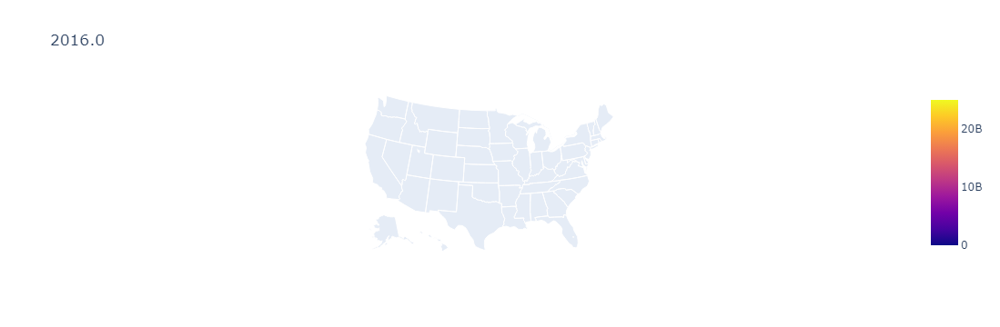

In [21]:
	
fig = dict(data=data, layout=layout)
	
plotly.offline.iplot(fig)